In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import os


pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.1f' % x)

# dataset = pd.read_csv("simulated_stats_base.csv")
# dataset = pd.read_csv("simulated_stats_reinvest.csv")
dataset = pd.read_csv("simulated_stats_dynamical.csv")

dataset = dataset.drop(['id'], axis=1)
dataset = dataset.drop_duplicates()
dataset['date'] = dataset['date'].apply(lambda name : name[:-9])
dataset = dataset[dataset['date'] != '2024 08 04']
dataset = dataset[dataset['date'] != '2024 08 05']
dataset = dataset[dataset['date'] != '2024 08 06']
dataset = dataset[dataset['date'] != '2024 08 07']
dataset = dataset[dataset['date'] != '2024 08 08']

In [56]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
data = data.reset_index().sort_values(['profit'], ascending=False)

data['profit_percnet'] = data['name'].apply(lambda name : name.split('_')[1])
data['drop_percent'] = data['name'].apply(lambda name : name.split('_')[2])
data['parts_of_deposit'] = data['name'].apply(lambda name : name.split('_')[3])

data.to_csv("skb_bots_stat.csv")
data.head(30)

,name,profit,profit_percnet,drop_percent,parts_of_deposit
61,BOT_0.5%_0.1%_100,76759.8,0.5%,0.1%,100
69,BOT_0.5%_0.1%_90,76454.8,0.5%,0.1%,90
82,BOT_0.5%_0.5%_20,75458.0,0.5%,0.5%,20
90,BOT_0.5%_1.0%_10,74515.2,0.5%,1.0%,10
129,BOT_1.0%_0.1%_90,74184.3,1.0%,0.1%,90
73,BOT_0.5%_0.3%_30,73722.5,0.5%,0.3%,30
121,BOT_1.0%_0.1%_100,73712.6,1.0%,0.1%,100
68,BOT_0.5%_0.1%_80,72807.8,0.5%,0.1%,80
133,BOT_1.0%_0.3%_30,72515.9,1.0%,0.3%,30
128,BOT_1.0%_0.1%_80,71529.3,1.0%,0.1%,80


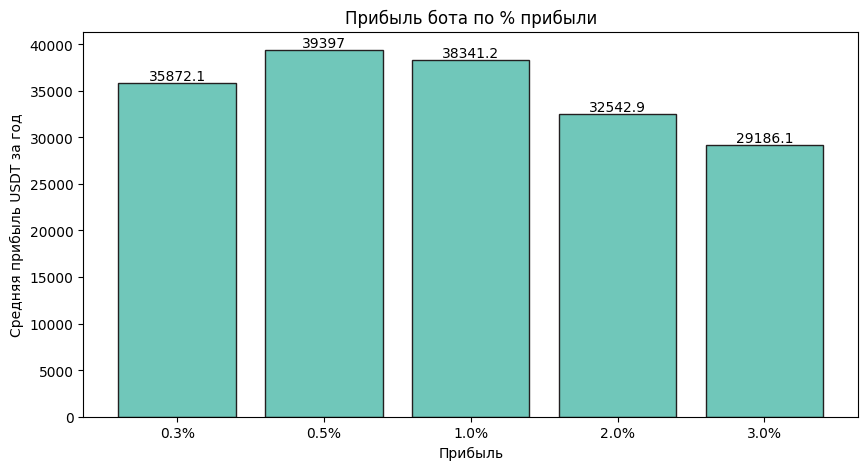

In [57]:
data = dataset.copy()
data['name'] = data['name'].apply(lambda name : name.split('_')[1])

data = data.groupby(['name'])['profit'].sum().apply(lambda profit: profit/60)
data = data.reset_index().sort_values(['name'], ascending=True)

x = data['name'].to_numpy()
y = data['profit'].to_numpy()

plt.figure(figsize=(10,5))

bars = plt.bar(x, y, alpha=1, color='#70C7BA', linewidth=1.0, edgecolor='#231F20') 
plt.bar_label(bars)
plt.xlabel('Прибыль')
plt.ylabel('Средняя прибыль USDT за год')
plt.title('Прибыль бота по % прибыли')
plt.savefig('Прибыль бота по % прибыли.png')
plt.show()

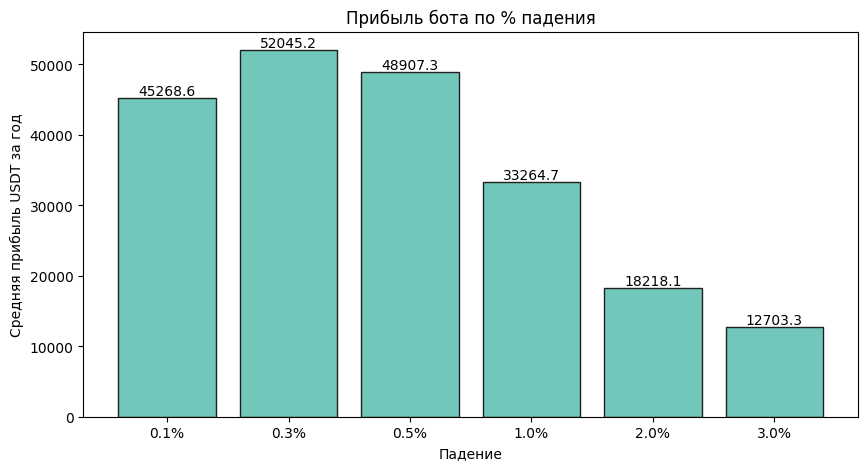

In [58]:
data = dataset.copy()
data['name'] = data['name'].apply(lambda name : name.split('_')[2])

data = data.groupby(['name'])['profit'].sum().apply(lambda profit: profit/50)
data = data.reset_index().sort_values(['name'], ascending=True)

x = data['name'].to_numpy()
y = data['profit'].to_numpy()

plt.figure(figsize=(10,5))

bars = plt.bar(x, y, alpha=1, color='#70C7BA', linewidth=1.0, edgecolor='#231F20') 
plt.bar_label(bars)
plt.xlabel('Падение')
plt.ylabel('Средняя прибыль USDT за год')
plt.title('Прибыль бота по % падения')
plt.savefig('Прибыль бота по % падения.png')
plt.show()

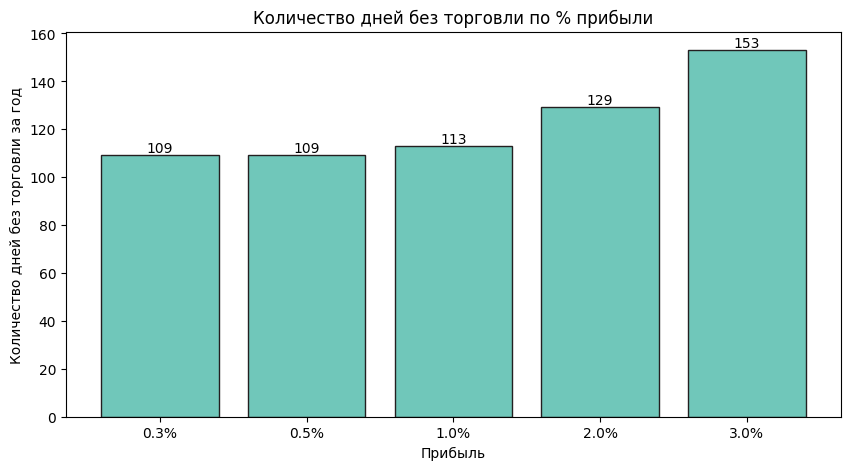

In [59]:
data = dataset.copy()
data['name'] = data['name'].apply(lambda name : name.split('_')[1])

data['trades'] = data['trades'].mask(data['trades'].ne(0))
data = data.groupby(['name'])['trades'].value_counts()
data = data.reset_index().sort_values(['name'], ascending=True)
x = data['name'].to_numpy()
y = data['count'].to_numpy()/60
plt.figure(figsize=(10,5))

bars = plt.bar(x, y.round(), alpha=1, color='#70C7BA', linewidth=1.0, edgecolor='#231F20') 
plt.bar_label(bars)
plt.xlabel('Прибыль')
plt.ylabel('Количество дней без торговли за год')
plt.title('Количество дней без торговли по % прибыли')
plt.savefig('Количество дней без торговли по % прибыли.png')
plt.show()

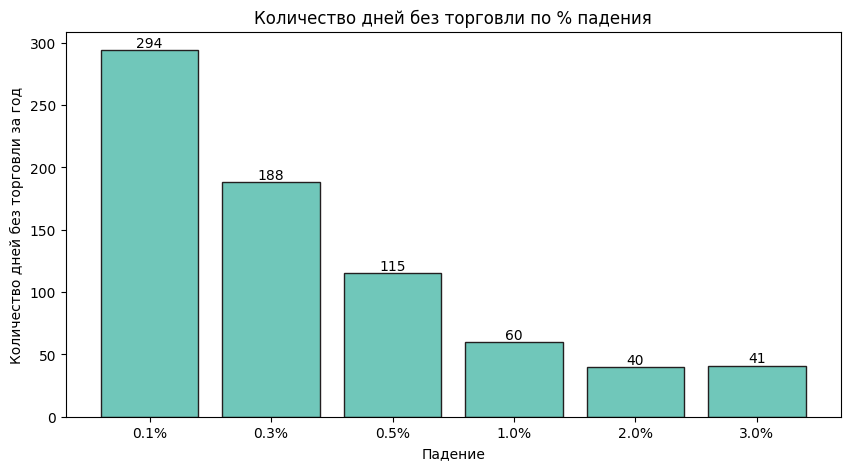

In [60]:
data = dataset.copy()
data['name'] = data['name'].apply(lambda name : name.split('_')[2])

data['trades'] = data['trades'].mask(data['trades'].ne(0))
data = data.groupby(['name'])['trades'].value_counts()
data = data.reset_index().sort_values(['name'], ascending=True)
x = data['name'].to_numpy()
y = data['count'].to_numpy()/50
plt.figure(figsize=(10,5))

bars = plt.bar(x, y.round(), alpha=1, color='#70C7BA', linewidth=1.0, edgecolor='#231F20') 
plt.bar_label(bars)
plt.xlabel('Падение')
plt.ylabel('Количество дней без торговли за год')
plt.title('Количество дней без торговли по % падения')
plt.savefig('Количество дней без торговли по % падения.png')
plt.show()

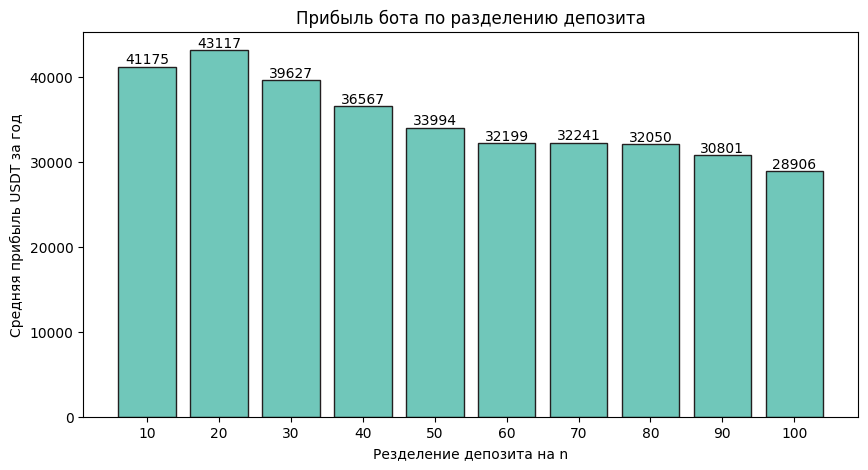

In [61]:
data = dataset.copy()
data['name'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data = data.groupby(['name'])['profit'].sum().apply(lambda profit: profit/30)
data = data.reset_index().sort_values(['name'], ascending=True)
data['name'] = data['name'].apply(lambda name : str(name))

x = data['name'].to_numpy()
y = data['profit'].to_numpy()

plt.figure(figsize=(10,5))

bars = plt.bar(x, y.round(), alpha=1, color='#70C7BA', linewidth=1.0, edgecolor='#231F20') 
plt.bar_label(bars)
plt.xlabel('Резделение депозита на n')
plt.ylabel('Средняя прибыль USDT за год')
plt.title('Прибыль бота по разделению депозита')
plt.savefig('Прибыль бота по разделению депозита.png')
plt.show()

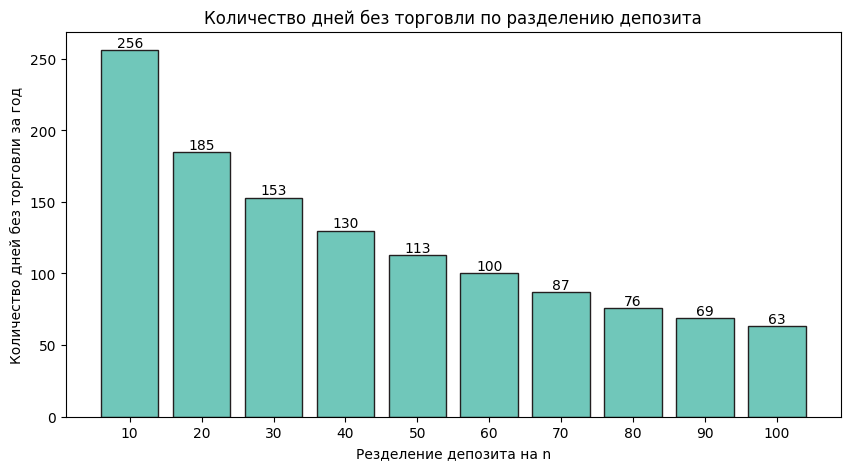

In [62]:
data = dataset.copy()
data['name'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data['trades'] = data['trades'].mask(data['trades'].ne(0))
data = data.groupby(['name'])['trades'].value_counts()
data = data.reset_index().sort_values(['name'], ascending=True)
data['name'] = data['name'].apply(lambda name : str(name))

x = data['name'].to_numpy()
y = data['count'].to_numpy()/30
plt.figure(figsize=(10,5))

bars = plt.bar(x, y.round(), alpha=1, color='#70C7BA', linewidth=1.0, edgecolor='#231F20') 
plt.bar_label(bars)
plt.xlabel('Резделение депозита на n')
plt.ylabel('Количество дней без торговли за год')
plt.title('Количество дней без торговли по разделению депозита')
plt.savefig('Количество дней без торговли по разделению депозита.png')
plt.show()

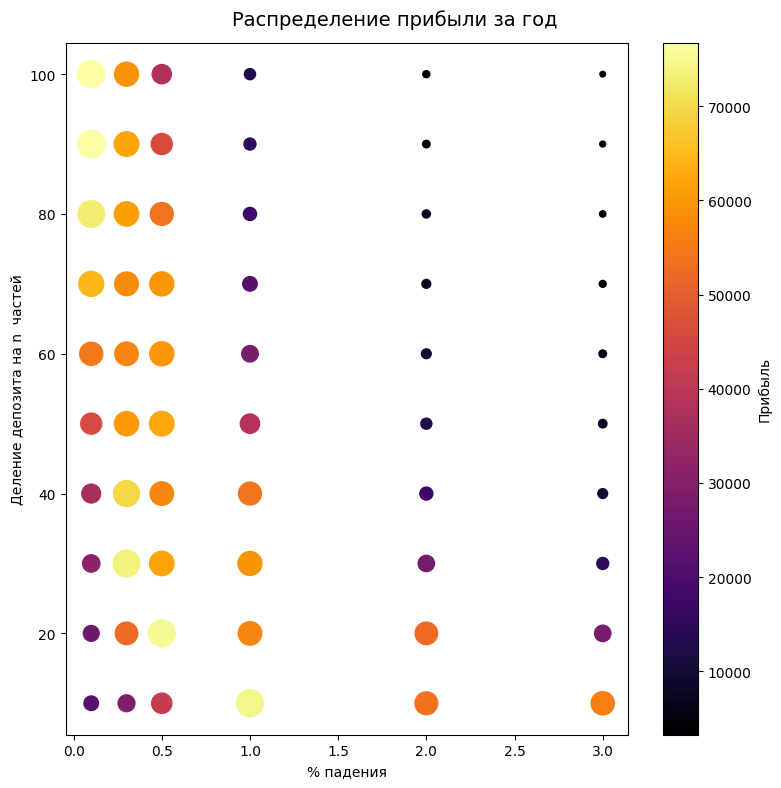

In [63]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
data = data.reset_index().sort_values(['profit'], ascending=False)

data['profit_percnet'] = data['name'].apply(lambda name : float(name.split('_')[1].replace('%', '')))
data['drop_percent'] = data['name'].apply(lambda name : float(name.split('_')[2].replace('%', '')))
data['parts_of_deposit'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data = data[data['profit_percnet'] == 0.5]

max_profit = data['profit'].max()
min_profit = data['profit'].min()

colormap = plt.cm.inferno
normalize = Normalize(vmin=min_profit, vmax=max_profit)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Распределение прибыли за год", size=14)

fig.colorbar(plt.cm.ScalarMappable(norm=normalize, cmap=colormap), ax=ax, label="Прибыль")

ax.scatter(data['drop_percent'], data['parts_of_deposit'], c=data['profit'], marker='o', s=data['profit']/200, cmap=colormap, norm=normalize)
ax.set_xlabel("% падения")
ax.set_ylabel("Деление депозита на n  частей")

fig.tight_layout()

plt.savefig('Распределение прибыли за год.png')
plt.show()

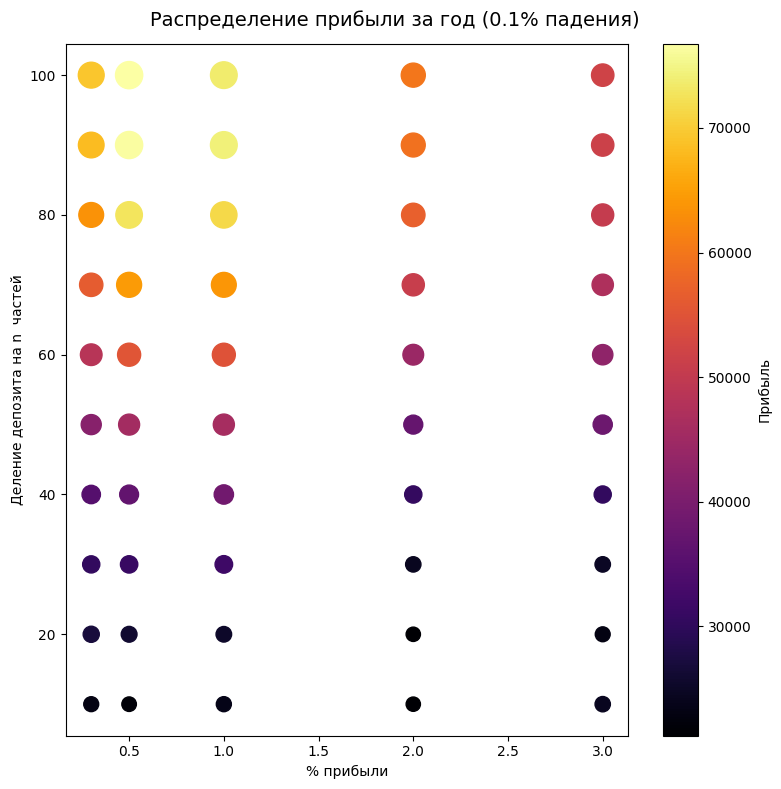

In [64]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
data = data.reset_index().sort_values(['profit'], ascending=False)

data['profit_percnet'] = data['name'].apply(lambda name : float(name.split('_')[1].replace('%', '')))
data['drop_percent'] = data['name'].apply(lambda name : float(name.split('_')[2].replace('%', '')))
data['parts_of_deposit'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data = data[data['drop_percent'] == 0.1]

max_profit = data['profit'].max()
min_profit = data['profit'].min()

colormap = plt.cm.inferno
normalize = Normalize(vmin=min_profit, vmax=max_profit)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Распределение прибыли за год (0.1% падения)", size=14)

fig.colorbar(plt.cm.ScalarMappable(norm=normalize, cmap=colormap), ax=ax, label="Прибыль")

ax.scatter(data['profit_percnet'], data['parts_of_deposit'], c=data['profit'], marker='o', s=data['profit']/200, cmap=colormap, norm=normalize)
ax.set_xlabel("% прибыли")
ax.set_ylabel("Деление депозита на n  частей")

fig.tight_layout()

plt.savefig('Распределение прибыли за год (0.1% падения).png')
plt.show()

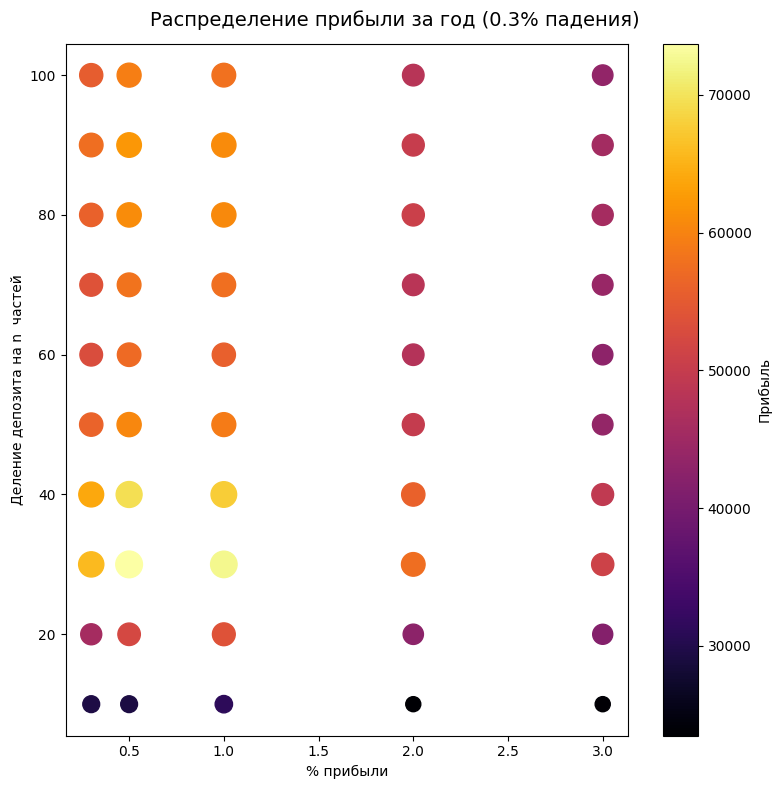

In [65]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
data = data.reset_index().sort_values(['profit'], ascending=False)

data['profit_percnet'] = data['name'].apply(lambda name : float(name.split('_')[1].replace('%', '')))
data['drop_percent'] = data['name'].apply(lambda name : float(name.split('_')[2].replace('%', '')))
data['parts_of_deposit'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data = data[data['drop_percent'] == 0.3]

max_profit = data['profit'].max()
min_profit = data['profit'].min()

colormap = plt.cm.inferno
normalize = Normalize(vmin=min_profit, vmax=max_profit)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Распределение прибыли за год (0.3% падения)", size=14)

fig.colorbar(plt.cm.ScalarMappable(norm=normalize, cmap=colormap), ax=ax, label="Прибыль")

ax.scatter(data['profit_percnet'], data['parts_of_deposit'], c=data['profit'], marker='o', s=data['profit']/200, cmap=colormap, norm=normalize)
ax.set_xlabel("% прибыли")
ax.set_ylabel("Деление депозита на n  частей")

fig.tight_layout()

plt.savefig('Распределение прибыли за год (0.3% падения).png')
plt.show()

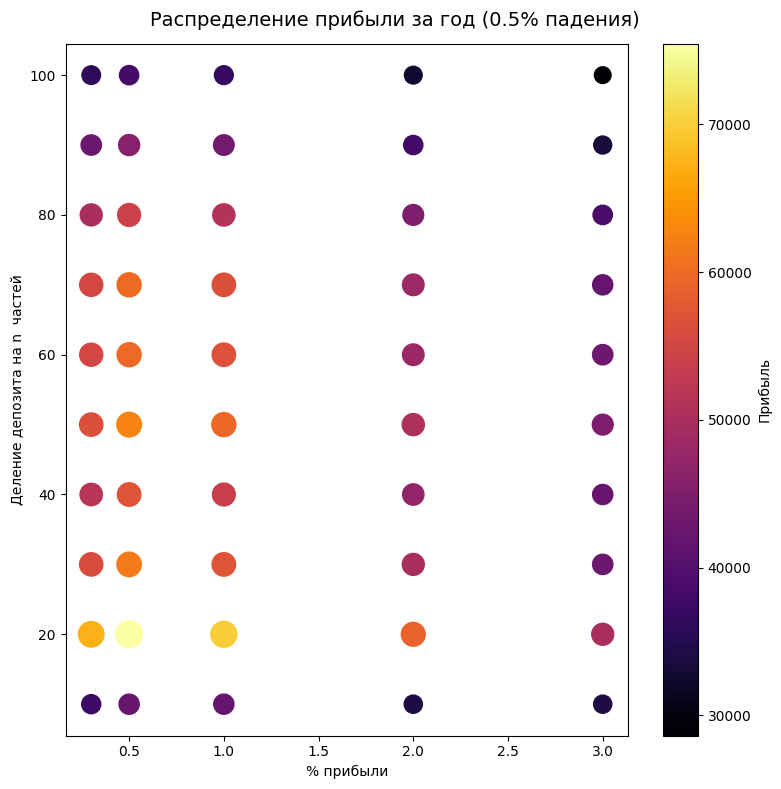

In [66]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
data = data.reset_index().sort_values(['profit'], ascending=False)

data['profit_percnet'] = data['name'].apply(lambda name : float(name.split('_')[1].replace('%', '')))
data['drop_percent'] = data['name'].apply(lambda name : float(name.split('_')[2].replace('%', '')))
data['parts_of_deposit'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data = data[data['drop_percent'] == 0.5]

max_profit = data['profit'].max()
min_profit = data['profit'].min()

colormap = plt.cm.inferno
normalize = Normalize(vmin=min_profit, vmax=max_profit)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Распределение прибыли за год (0.5% падения)", size=14)

fig.colorbar(plt.cm.ScalarMappable(norm=normalize, cmap=colormap), ax=ax, label="Прибыль")

ax.scatter(data['profit_percnet'], data['parts_of_deposit'], c=data['profit'], marker='o', s=data['profit']/200, cmap=colormap, norm=normalize)
ax.set_xlabel("% прибыли")
ax.set_ylabel("Деление депозита на n  частей")

fig.tight_layout()

plt.savefig('Распределение прибыли за год (0.5% падения).png')
plt.show()

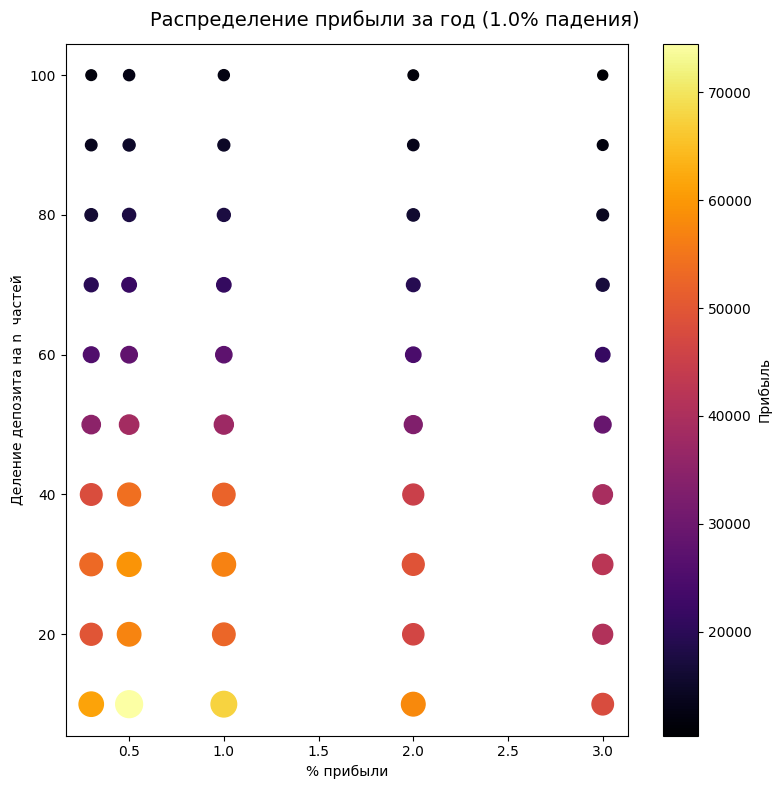

In [67]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
data = data.reset_index().sort_values(['profit'], ascending=False)

data['profit_percnet'] = data['name'].apply(lambda name : float(name.split('_')[1].replace('%', '')))
data['drop_percent'] = data['name'].apply(lambda name : float(name.split('_')[2].replace('%', '')))
data['parts_of_deposit'] = data['name'].apply(lambda name : int(name.split('_')[3]))

data = data[data['drop_percent'] == 1.0]

max_profit = data['profit'].max()
min_profit = data['profit'].min()

colormap = plt.cm.inferno
normalize = Normalize(vmin=min_profit, vmax=max_profit)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Распределение прибыли за год (1.0% падения)", size=14)

fig.colorbar(plt.cm.ScalarMappable(norm=normalize, cmap=colormap), ax=ax, label="Прибыль")

ax.scatter(data['profit_percnet'], data['parts_of_deposit'], c=data['profit'], marker='o', s=data['profit']/200, cmap=colormap, norm=normalize)
ax.set_xlabel("% прибыли")
ax.set_ylabel("Деление депозита на n  частей")

fig.tight_layout()

plt.savefig('Распределение прибыли за год (1.0% падения).png')
plt.show()

In [68]:
# data = dataset.copy()

# data = data.groupby(['name'])['profit'].sum()
# data = data.reset_index().sort_values(['profit'], ascending=False)

# data['profit_percnet'] = data['name'].apply(lambda name : float(name.split('_')[1].replace('%', '')))
# data['drop_percent'] = data['name'].apply(lambda name : float(name.split('_')[2].replace('%', '')))
# data['parts_of_deposit'] = data['name'].apply(lambda name : int(name.split('_')[3]))

# data = data[data['drop_percent'] == 0.1]

# data10 = data[data['parts_of_deposit'] == 10]
# data20 = data[data['parts_of_deposit'] == 20]
# data30 = data[data['parts_of_deposit'] == 30]
# data40 = data[data['parts_of_deposit'] == 40]
# data50 = data[data['parts_of_deposit'] == 50]
# data60 = data[data['parts_of_deposit'] == 60]
# data70 = data[data['parts_of_deposit'] == 70]
# data80 = data[data['parts_of_deposit'] == 80]
# data90 = data[data['parts_of_deposit'] == 90]
# data100 = data[data['parts_of_deposit'] == 100]

# datas = [data10['profit'], data20['profit'], data30['profit'], 
#          data40['profit'], data50['profit'], data60['profit'], 
#          data70['profit'], data80['profit'], data90['profit'], data100['profit']]



# fig, ax = plt.subplots(figsize=(8, 8))
# fig.suptitle("Распределение прибыли за год", size=14)
# ax.set_ylabel('Прибыль')

# bplot = ax.boxplot(datas,
#                    patch_artist=True,
#                    tick_labels=[10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

# # fill with colors
# # for patch, color in zip(bplot['boxes'], colors):
# #     patch.set_facecolor(color)

# plt.show()

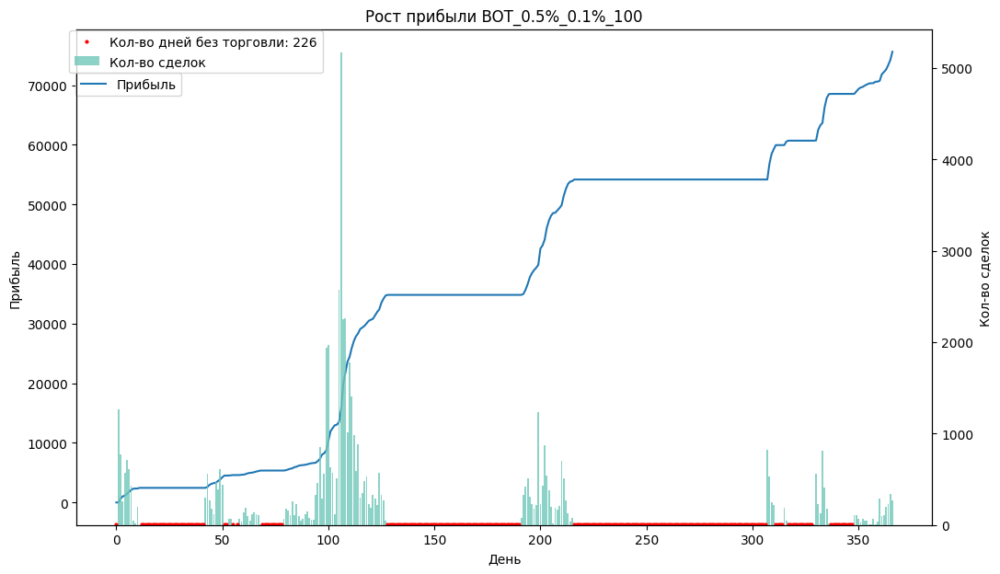

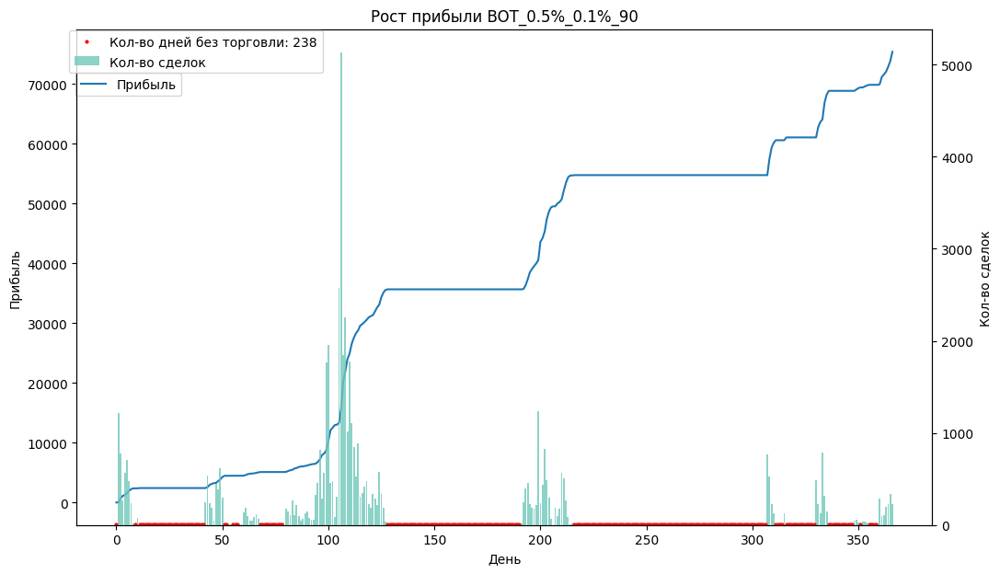

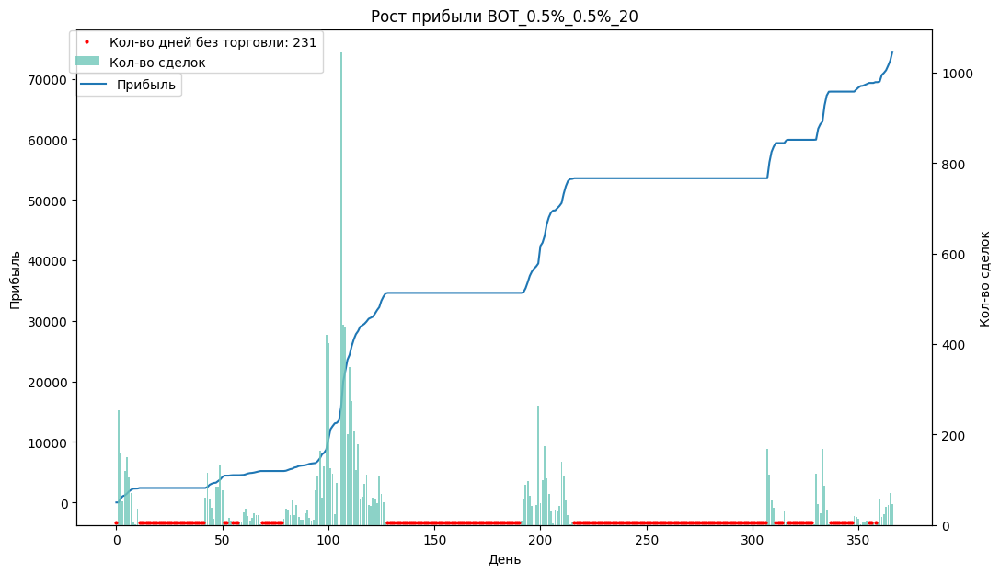

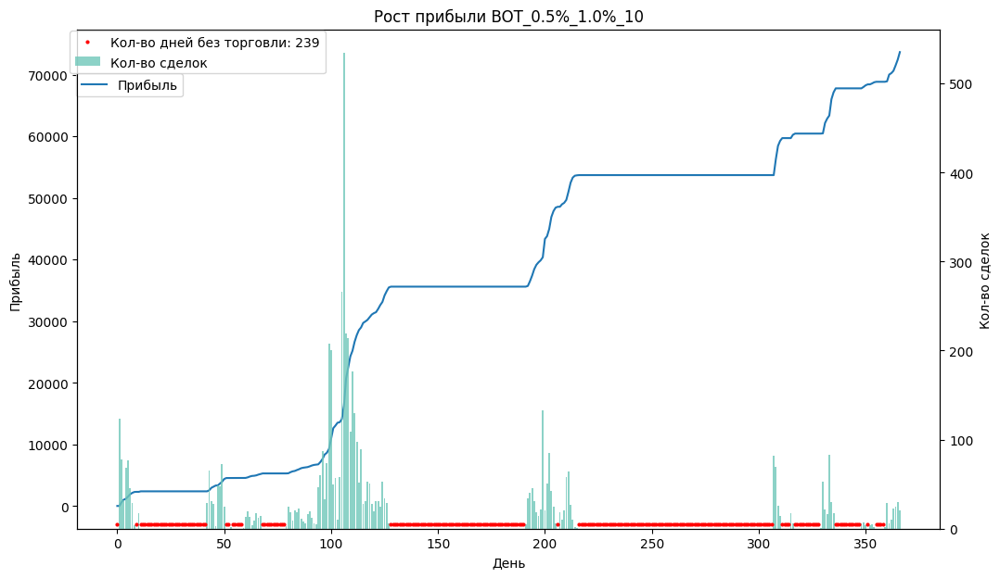

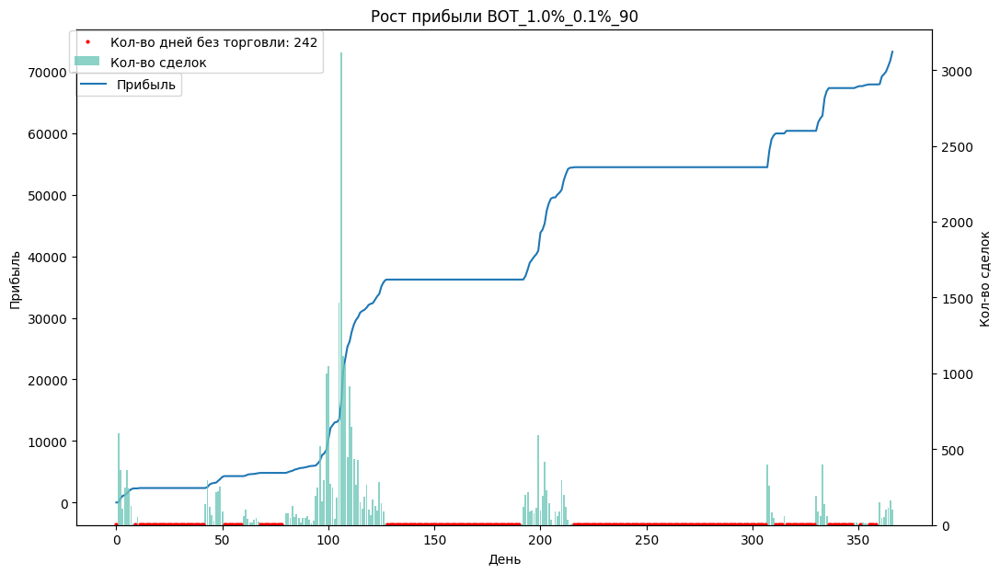

...

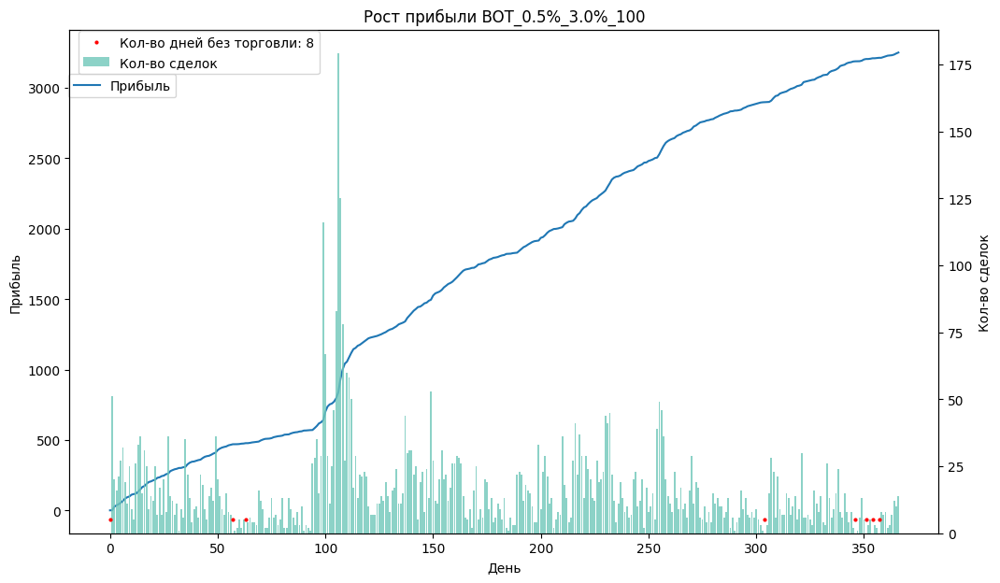

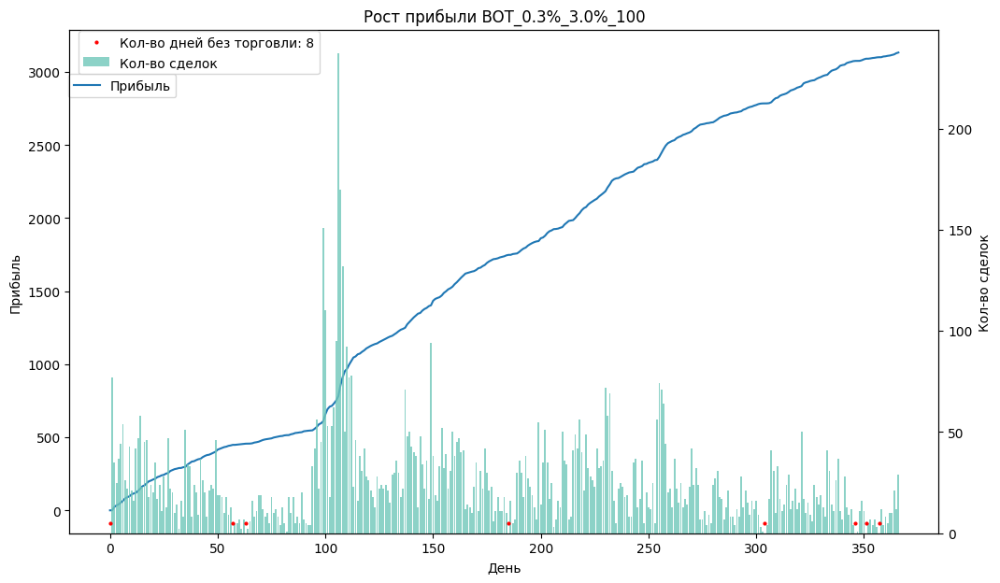

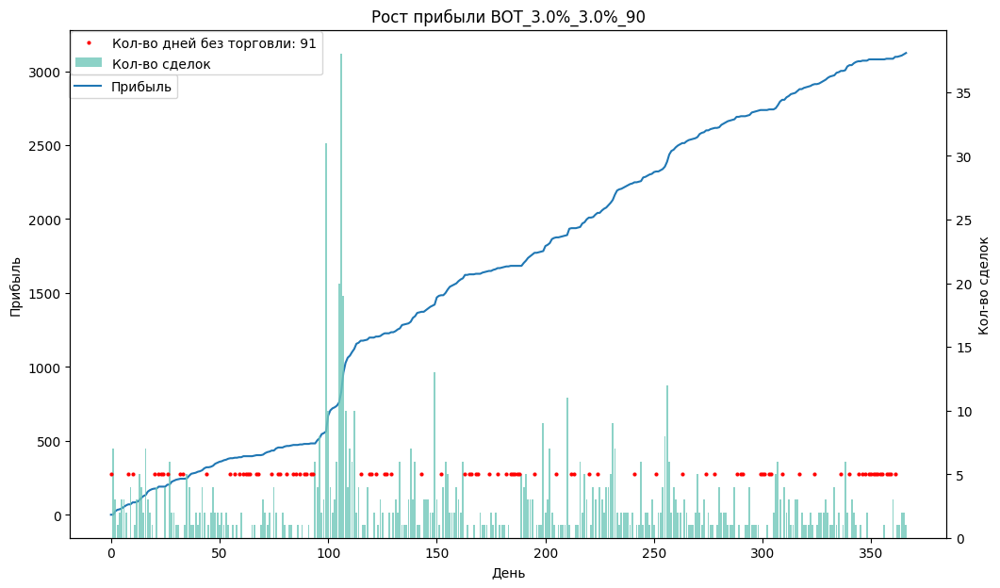

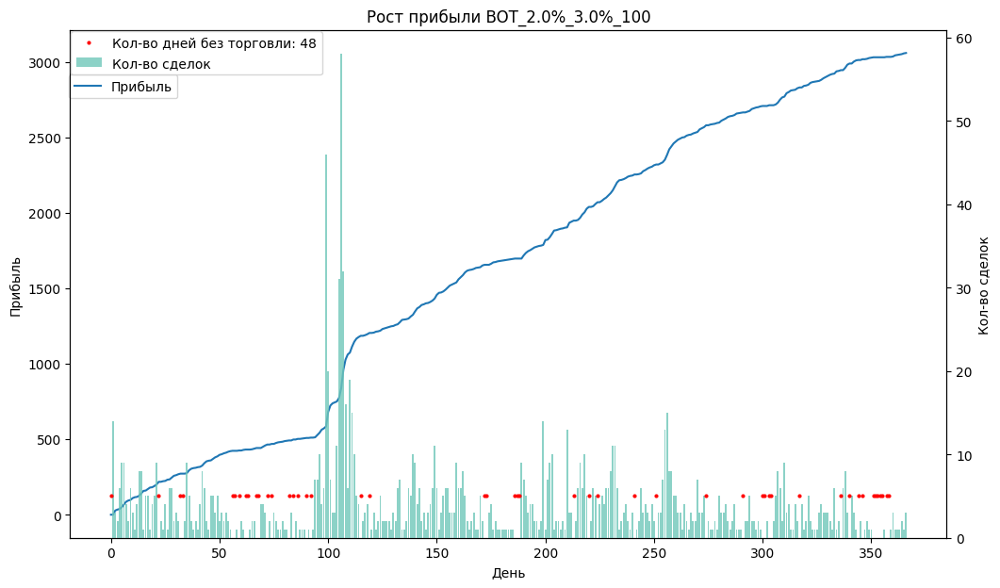

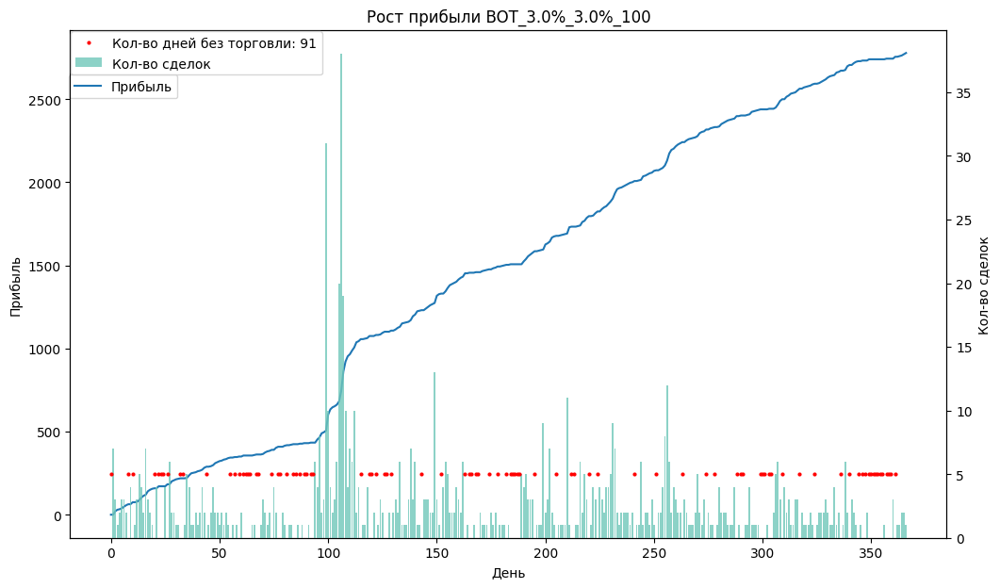

In [69]:
data = dataset.copy()

data = data.groupby(['name'])['profit'].sum()
names = data.reset_index().sort_values(['profit'], ascending=False)['name']

os.mkdir('Боты')

for i in range(len(names)):
# for i in range(1):
    data = dataset[dataset['name'] == names.iloc[i]].sort_values(['date'], ascending=True)
    trades = data['trades']
    profit = list()
    for j in range(len(data)):
        profit.append(data[0: j]['profit'].sum())
    
    fig, ax1 = plt.subplots(figsize=(12, 7))

    ax1.plot(range(len(data)), profit, label='Прибыль')
    ax1.set_xlabel('День')
    ax1.set_ylabel('Прибыль')
    ax1.legend(bbox_to_anchor=(0.13, 0.925))

    ax2 = ax1.twinx()
    ax2.bar(range(len(data)), trades, label='Кол-во сделок', color='#70C7BA', alpha=0.8)
    ax2.set_ylabel('Кол-во сделок')
    y_hold = []
    for j in range(len(data)):
        if data.iloc[j]['trades'] == 0:
            y_hold.append(j)
    
    ax2.plot(y_hold, [5]*len(y_hold), 'o', c='r', markersize=2, label='Кол-во дней без торговли: ' + str(len(y_hold)))
    ax2.legend(bbox_to_anchor=(0.295, 1.01))


    plt.title('Рост прибыли ' + names.iloc[i])
    plt.savefig('Боты/' + names.iloc[i] + '.png')
    plt.show()